# Metadata

```yaml
Course:    DS 5001
Module:    12 Lab
Topic:     Classification with Naive Bayes
Author:    R.C. Alvarado
Date:      16 April 2023 (revised)
```

**Purpose:** We attempt a Naive Bayes classifier for the sentiment of a corpus of wine reviews. We use the score of the review as our sentiment value, assuming that a bad review will have negative sentiment and a good review will have positive sentiment.

# Overview

The prediction of the document's ($d$) label or class $c$ can be viewed as problem of conditional probability:
* $p(c|d)$ ?
* $p(c|d) = \large\frac{p(c)p(d|c)}{p(d)}$
* $p(c|d) = p(c)p(d|c)$

We use Maximum A Posteriori estimation (MAP) to predict the label:
* $p(c|d) = \underset{C}{\mathrm{argmax}} p(c)p(d|c)$ 

To solve this, we need to estimate the values of the priors $p(c)$ and the likelihoods $p(d|c)$.
* Prior: $p(c)$ the independent frequency of a given category.
* Likelihood: $p(d|c)$ the frequency of the document for a given category. 

The likelihoods are essentially unigram language models for each label. They are similar to topics in this sense.

Note that $d$ is a sequence of words $w_{1}^{N}$, which means we apply the independence assumption to avoid the chain rule:
* $p(d|c) = p(w_{1}^{N}|c) = p(w_{1}|c)p(w_{2},w_{1}|c) ... $
* $p(d|c) = \prod{p(w_{i}|c}) = \sum{log(p(w_{i}|c))}$

So, we get:
* $p(c|d) = \underset{C}{\mathrm{argmax}} p(c)\sum{log(p(w_{i}|c))}$ 

We can estimate the priors and the likelihoods using Maximum Likelihood Estimation (MLE) from data that gives \
the joint distribution of documents and labels, where documents are represented as bags of words. 

This joint distribution is just the TOKEN table with the label from the LIB table joined to it.
* $(d,w,c)$


# Set Up

## Configure

In [1]:
import configparser
config = configparser.ConfigParser()
config.read("../../../env.ini")
data_home = config['DEFAULT']['data_home']
output_dir = config['DEFAULT']['output_dir']
local_lib = config['DEFAULT']['local_lib']

In [2]:
data_prefix = 'winereviews'
data_path = f"{data_home}/{data_prefix}/{data_prefix}"

**Set some parameters**

We create an empty static class to store our parameters.

In [3]:
class Params:
    test_size = 0.20
    smooth_alpha = .1

## Import

In [4]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
import plotly_express as px

# Preparation

## Import wine reviews

In [5]:
docs = pd.read_csv(f'{data_path}.csv', index_col='doc_id')

In [6]:
docs.head()

,doc_content,points
doc_id,,
0,"Aromas include tropical fruit, broom, brimston...",87
1,"This is ripe and fruity, a wine that is smooth...",87
2,"Tart and snappy, the flavors of lime flesh and...",87
3,"Pineapple rind, lemon pith and orange blossom ...",87
4,"Much like the regular bottling from 2012, this...",87


In [7]:
docs.points.median()

88.0

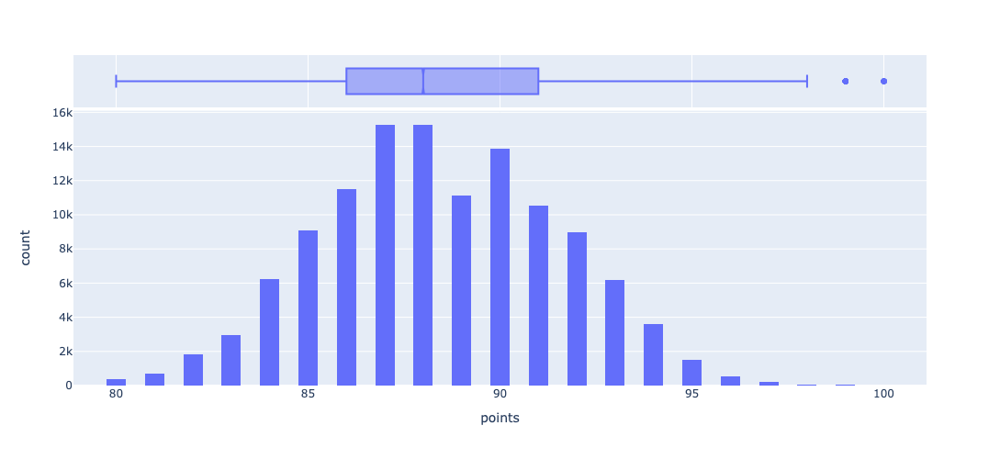

In [123]:
px.histogram(docs, x='points', nbins=50, marginal='box', height=500, width=700)

## Convert points to labels

We treat the point scale as in school, where 80 .. 89 = B and 90 .. 100 = B\
even though this assigns 11 values to A and 10 to B.

We do this because people interpret 80s and 90s differently.

Notice the gap between 89 and 90.

We will map A $\rightarrow$ P and B $\rightarrow$ N (for positive and negative).

In [9]:
thresh = 90

In [10]:
docs['doc_label'] = 'N'
docs.loc[docs.points >= 90, 'doc_label'] = 'P'

In [11]:
docs

,doc_content,points,doc_label
doc_id,,,
0,"Aromas include tropical fruit, broom, brimston...",87,N
1,"This is ripe and fruity, a wine that is smooth...",87,N
2,"Tart and snappy, the flavors of lime flesh and...",87,N
3,"Pineapple rind, lemon pith and orange blossom ...",87,N
4,"Much like the regular bottling from 2012, this...",87,N
...,...,...,...
129966,Notes of honeysuckle and cantaloupe sweeten th...,90,P
129967,Citation is given as much as a decade of bottl...,90,P
129968,Well-drained gravel soil gives this wine its c...,90,P


## Balance sample

Are **doc lengths different by label**?

In [12]:
docs['doc_len'] = docs.doc_content.str.len()
LABEL = docs.groupby('doc_label').doc_len.mean().to_frame('doc_len_mean')

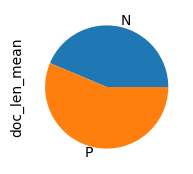

In [13]:
LABEL.doc_len_mean.plot.pie(figsize=(2,2));

Are doc length and label **correlated**?

In [14]:
docs[['doc_len', 'points']].corr().iloc[0,1].round(2)

0.56

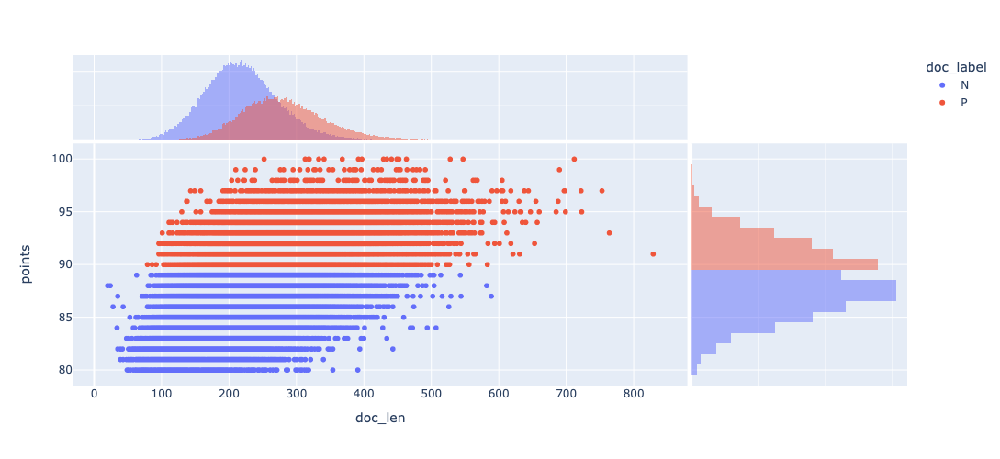

In [88]:
px.scatter(docs, 'doc_len', 'points', color='doc_label', width=600, height=500, 
           marginal_x='histogram', marginal_y='histogram')

What about **doc counts per label**?

In [16]:
LABEL['doc_count'] = docs.value_counts('doc_label').to_frame()

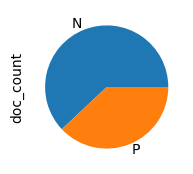

In [17]:
LABEL.doc_count.plot.pie(figsize=(2,2));

It interesting that 

In [18]:
LABEL.style.format(precision=2).background_gradient(cmap='YlGnBu', axis=0)

,doc_len_mean,doc_count
doc_label,,
N,218.61,74393
P,282.30,45585


It is interesting to note relationship between doc length and token count.

Negative reviews are shorter than positive ones, but\
there are also more of them.

If we look at **token counts per label**, we see that this yields a greater token count.

In [19]:
LABEL['token_count'] = docs.groupby('doc_label').doc_len.sum()

In [20]:
(LABEL / LABEL.sum()).style.format(precision=2).background_gradient(cmap='YlGnBu', axis=0)

,doc_len_mean,doc_count,token_count
doc_label,,,
N,0.44,0.62,0.56
P,0.56,0.38,0.44


In any case, we see that our dataset is imbalanced relative to our labels.

So, let's fix that.

We can balance by doc or token.

In [21]:
G1 = docs.groupby('doc_label')

In [22]:
N = G1.get_group('N').copy()
P = G1.get_group('P').copy()

**Balance by token**

In [23]:
# N['len_sum'] = N.doc_len.cumsum()
# P['len_sum'] = P.doc_len.cumsum()
# len_thresh = N.iloc[20000, :].len_sum
# DOC = pd.concat([P[P.len_sum <= len_thresh], N[N.len_sum <= len_thresh]])

**Balance by doc**

This has better performance.

The sample size was chosen trial and error.

In [24]:
n_samples = 20000 # If this is too big, the kernel may crash on modeling
DOC = pd.concat([P.sample(n_samples), N.sample(n_samples)])
DOC = DOC.sort_index()

Even though we are still imbalanced by token.

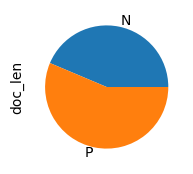

In [25]:
DOC.groupby('doc_label').doc_len.sum().plot.pie(figsize=(2,2));

## Divide docs into train and test sets

We remove stopwords and use a binary count.

We don't use TFIDF, although it would be interesting to try that.

In [26]:
count_engine = CountVectorizer(stop_words='english', binary=True)
count_model = count_engine.fit_transform(DOC.doc_content)
DTM = pd.DataFrame(count_model.toarray(), columns=count_engine.get_feature_names(), index=DOC.index)
X_train, X_test, y_train, y_test = train_test_split(DTM, DOC.doc_label, test_size=Params.test_size, random_state=0)

In [27]:
X_train = X_train.sort_index()
X_test = X_test.sort_index()
y_train = y_train.sort_index()
y_trdy = y_test.sort_index()

## Apply labels to tokens

In [28]:
TOKEN_CLASS = X_train.join(y_train).groupby('doc_label').sum().T

In [29]:
TOKEN_CLASS.sample(10)

doc_label,N,P
springtime,1,2
bargain,28,17
subside,3,8
mushroomy,18,28
stir,2,0
extravagant,1,8
current,15,26
montefico,0,1
steam,10,8
exult,0,1


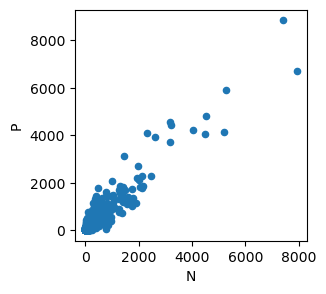

In [30]:
TOKEN_CLASS.plot.scatter('N','P', figsize=(3,3));

# Training 

## Estimate likelihoods $p(w|c)$

$$
\hat{P}(w_i|c) = \dfrac{count(w_i,c)}{\sum_{w \in V} count(w,c)}
$$

$$
\hat{P}(w_i|c) = \dfrac{count(w_i,c)+1}{\sum_{w \in V} (count(w,c)+1)} = \dfrac{count(w_i,c)+1}{(\sum_{w \in V} count(w,c))+|V|} 
$$

Now we compute the probability of a token given the label. 

This will in effect produce two language models, one for each label. 

Key idea = **the likelihoods are language models** (see Pearl for interpretation of likelihoods).

In [31]:
TOKEN_CLASS_SMOOTH = TOKEN_CLASS + Params.smooth_alpha

In [32]:
TOKEN_CLASS_LOG = np.log2(TOKEN_CLASS_SMOOTH / TOKEN_CLASS_SMOOTH.sum())

In [33]:
TOKEN_CLASS_LOG

doc_label,N,P
000,-13.860025,-13.482296
01,-21.711774,-17.663626
02,-18.252342,-18.596511
03,-16.757577,-17.101747
04,-15.053562,-15.261527
...,...,...
émilion,-16.757577,-15.906196
öküzgözü,-18.252342,-17.663626
über,-18.252342,-16.698391
überbest,-21.711774,-18.596511


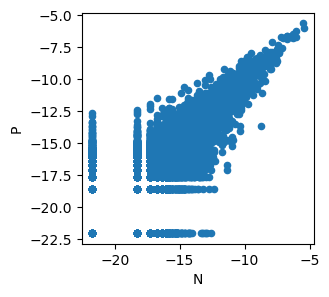

In [34]:
TOKEN_CLASS_LOG.plot.scatter('N', 'P', figsize=(3,3));

## Estimate priors $p(c)$

$$
\hat{P}(c) = \dfrac{N_{c}}{N_{d}}
$$

In [35]:
CLASS = TOKEN_CLASS.sum().to_frame('n')

In [36]:
CLASS['log'] = np.log2(CLASS.n/CLASS.n.sum())

In [37]:
CLASS

,n,log
doc_label,,
N,341411,-1.183359
P,433950,-0.837339


# Testing

## Compute posteriors $p(c|w)$

$$
c_{NB} = \arg\max \log{P(c)} + \sum_{id=1}^{id_{max}} \log{P(token_{id}|c)}
$$




In [38]:
y_hat = (X_test.dot(TOKEN_CLASS_LOG) + CLASS.log).idxmax(1)

In [39]:
RESULT = pd.concat([y_test, y_hat], keys=['doc_label', 'prediction'], axis=1)

In [124]:
RESULT

,doc_label,prediction,result
doc_id,,,
39310,P,P,True
33498,N,N,True
12846,N,P,False
24860,N,N,True
100269,P,P,True
...,...,...,...
123811,P,P,True
22498,P,P,True
25726,N,N,True


# Evaluation

In [40]:
RESULT['result'] = RESULT.doc_label == RESULT.prediction

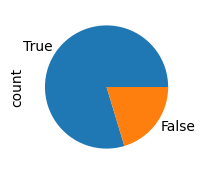

In [41]:
RESULT.value_counts('result').plot.pie(figsize=(2,2));

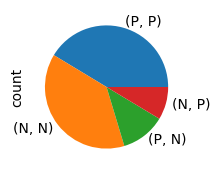

In [42]:
RESULT.value_counts(['prediction','doc_label']).plot.pie(figsize=(2,2));

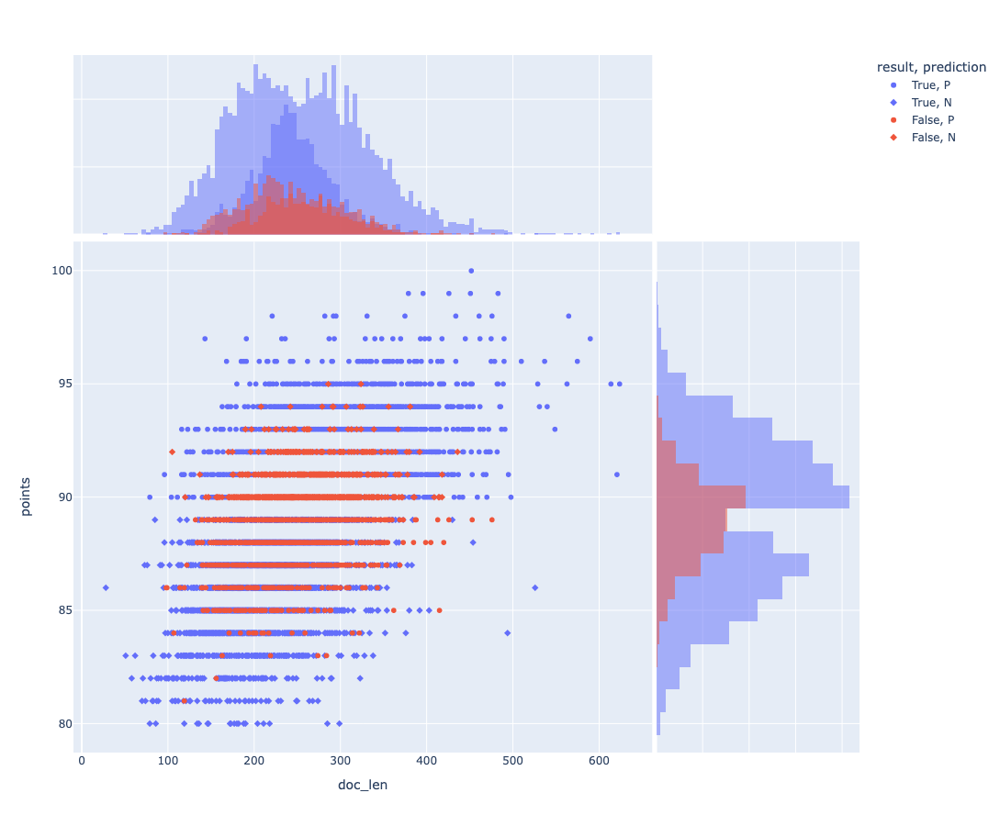

In [92]:
px.scatter(RESULT.join(DOC[['doc_content','points','doc_len']], how='inner').reset_index(), 'doc_len', 'points', color='result', symbol='prediction',
           height=900, width=1000, marginal_x='histogram', marginal_y='histogram')

## Get confusion matrix

In [43]:
CM = RESULT.value_counts(['prediction','doc_label']).unstack()

In [44]:
CM.style.background_gradient(axis=None)

doc_label,N,P
prediction,,
N,3065,689
P,938,3308


In [45]:
def get_results(CM, model_id):
    
    R = pd.DataFrame(index=[model_id])
    R.index.name = 'model_id'
    
    # COUNTS
    R['TN'] = CM.iloc[0,0]   # correct rejections
    R['FN'] = CM.iloc[0,1]   # Type II errors or misses
    R['TP'] = CM.iloc[1,1]   # hits
    R['FP'] = CM.iloc[1,0]   # Type I errors or false alarms
    R['T'] = R.TP + R.TN     # All True
    R['F'] = R.FP + R.FN     # All False
    R['ALL'] = R['T'] + R.F  # All
    
    assert R.ALL.values[0] == CM.sum().sum()
    
    # RATIOS
    R['ACC'] = R['T'] / R.ALL                        # (Simple) Accuracy
    R['TPR'] = R.TP / (R.TP + R.FN)                  # Recall or Sensitivity
    R['TNR'] = R.TN / (R.TN + R.FP)                  # Specificity
    R['PPV'] = R.TP / (R.TP + R.FP)                  # Precision or Positive predictive value 
    R['BA'] = (R.TNR + R.TPR) / 2                    # Balanced Accuracy
    R['F1'] = (2 *  R.TP) / (2 * R.TP + R.FP + R.FN) # F-score where F = 1

    return R

In [46]:
R = get_results(CM, 'nb')

In [47]:
R.T.style.format(precision=3)

model_id,nb
TN,3065.000
FN,689.000
TP,3308.000
FP,938.000
T,6373.000
F,1627.000
ALL,8000.000
ACC,0.797
TPR,0.828
TNR,0.766


# Extract Sentiment

## Likelihoods as Sentiment Lexicon 

We make up a way to compute sentiment valence and polarity\
from the likelihoods data.

**Method A**

We subtract negative counts from positive.

This is simple way, but it's sensitive to word frequency.

In [96]:
TOKEN_CLASS.sample(3)

doc_label,N,P
term_str,,
advertisement,0,1
proceeds,1,2
tuscans,0,1


In [48]:
(TOKEN_CLASS.P - TOKEN_CLASS.N).sort_values()

flavors   -1212
aromas    -1076
soft       -779
simple     -755
light      -754
           ... 
ripe       1302
drink      1368
wine       1438
rich       1673
black      1784
Length: 20640, dtype: int64

With probabilities ...

In [104]:
Q = TOKEN_CLASS/ TOKEN_CLASS.sum()

In [105]:
(Q.P - Q.N).sort_values()

term_str
flavors        -0.007742
aromas         -0.005738
finish         -0.003810
soft           -0.002992
light          -0.002833
                  ...   
concentrated    0.002111
long            0.002165
black           0.002676
years           0.002676
rich            0.002948
Length: 20640, dtype: float64

**Method B**

We subtract negative log likelihoods from positive.

This produces better results since it downplays size.

In [125]:
SALEX = (TOKEN_CLASS_LOG.P - TOKEN_CLASS_LOG.N).to_frame('valence')
SALEX.index.name = 'term_str'
SALEX = SALEX.sort_values('valence')

In [126]:
SALEX['polarity'] = np.sign(SALEX['valence'])

In [127]:
from sklearn.preprocessing import MinMaxScaler

In [128]:
scaler = MinMaxScaler(feature_range=(-1, 1))
SALEX['normalized'] = scaler.fit_transform(SALEX[['valence']])

In [129]:
SALEX.sort_values('valence', ascending=False).head(20)

,valence,polarity,normalized
term_str,,,
91,9.088373,1.0,1.000000
exquisite,8.862845,1.0,0.975737
2035,8.373507,1.0,0.923091
dazzling,8.338825,1.0,0.919360
impeccable,8.266855,1.0,0.911617
radiant,8.069459,1.0,0.890380
extraordinary,8.069459,1.0,0.890380
2032,7.936601,1.0,0.876086
explosion,7.840706,1.0,0.865769


In [110]:
SALEX.sort_values('valence', ascending=True).head(20)

,valence,polarity,normalized
term_str,,,
watery,-9.501516,-1.0,-3.479700
dilute,-9.192792,-1.0,-3.370473
melony,-9.095713,-1.0,-3.336126
mealy,-8.991628,-1.0,-3.299300
weedy,-8.840024,-1.0,-3.245662
diluted,-8.799497,-1.0,-3.231323
scouring,-8.714857,-1.0,-3.201377
chemical,-7.995221,-1.0,-2.946767
clipped,-7.844015,-1.0,-2.893270


**Ratio of positive to negative terms**

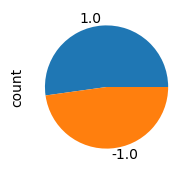

In [130]:
SALEX.polarity.value_counts().plot.pie(figsize=(2,2));

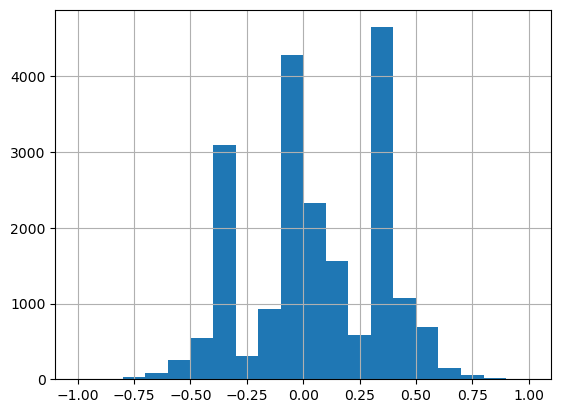

In [131]:
SALEX.normalized.hist(bins=20);

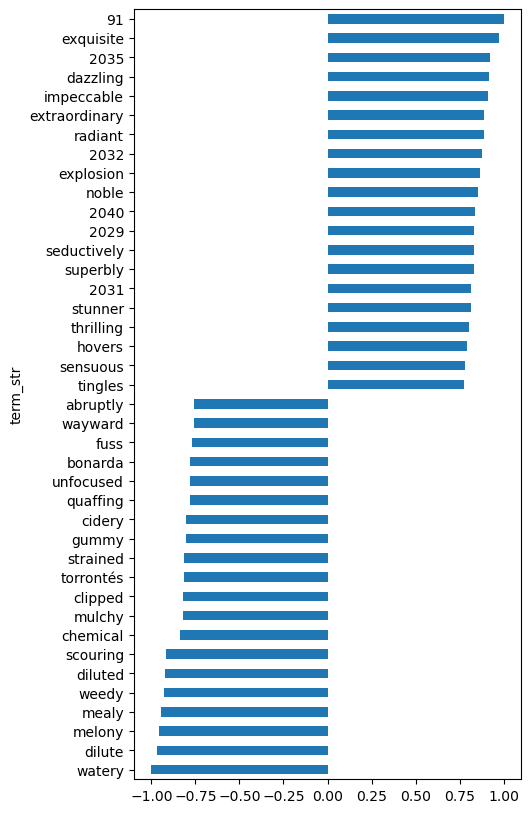

In [132]:
pd.concat([SALEX.normalized.head(20),SALEX.normalized.tail(20)]).plot.barh(figsize=(5,10));

# Save

In [133]:
X_test.to_pickle(f"{data_home}/{data_prefix}/{data_prefix}-X_test.csv.pickle") 
X_train.to_pickle(f"{data_home}/{data_prefix}/{data_prefix}-X_train.csv.pickle") 
y_test.to_pickle(f"{data_home}/{data_prefix}/{data_prefix}-y_test.csv.pickle") 
y_train.to_pickle(f"{data_home}/{data_prefix}/{data_prefix}-y_train.csv.pickle") 

In [134]:
SALEX.to_csv(f"{data_path}-NB_SALEX.csv", index=True)
R.to_csv(f"{data_path}-NB_RESULT.csv", index=True)

In [135]:
DOC.to_csv(f"{data_home}/{data_prefix}/{data_prefix}-DOC_UNSPLIT.csv")